In [1]:
#Imports and library used

import pandas as pd
from tabulate import tabulate
from IPython.display import display, HTML
import io
import sys
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from sklearn.preprocessing import LabelEncoder
import plotly.graph_objects as go
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy.stats import linregress
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
# Loading the dataset
df = pd.read_csv("heat_profile_data.csv")

# Displaying the first 5 rows in a neat tabular format
print("First 5 rows of the dataset (Tabulate format):")

# Creating the table
table = tabulate(df.head(), headers='keys', tablefmt='html', showindex=False)

# Custom CSS Styling for the Table
styled_table = f"""
<div style="font-family: Arial, sans-serif; background-color: #f9f9f9; padding: 20px; border-radius: 10px;">
    <table style="width: 100%; border-collapse: collapse; margin: 25px 0; font-size: 16px; text-align: center; border: 1px solid #ddd;">
        <thead style="background-color: #4CAF50; color: white; font-weight: bold; text-align: center;">
            {table.split('<thead>')[1].split('</thead>')[0]}
        </thead>
        <tbody style="background-color: #ffffff;">
            {table.split('<tbody>')[1].split('</tbody>')[0]}
        </tbody>
    </table>
</div>
"""

# Displaying the styled table in Jupyter Notebook
display(HTML(styled_table))

First 5 rows of the dataset (Tabulate format):


utc_timestamp,cet_cest_timestamp,country,profile_type,water,space
2007-12-31T22:00:00Z,2007-12-31T23:00:00+0100,AT,COM,66,211
2007-12-31T22:00:00Z,2007-12-31T23:00:00+0100,AT,MFH,68,158
2007-12-31T22:00:00Z,2007-12-31T23:00:00+0100,AT,SFH,12,177
2007-12-31T23:00:00Z,2008-01-01T00:00:00+0100,AT,COM,66,211
2007-12-31T23:00:00Z,2008-01-01T00:00:00+0100,AT,MFH,68,158


In [ ]:
#summary for dataset

# Getting the descriptive statistics
desc_stats = df.describe()

# Converting to HTML table
table_desc = tabulate(desc_stats, headers='keys', tablefmt='html', showindex=True)

# Using Custom CSS Styling for the Descriptive Statistics Table
styled_desc_table = f"""
<div style="font-family: 'Arial', sans-serif; background-color: #f9f9f9; padding: 20px; border-radius: 10px;">
    <h3 style="text-align: center; color: #4CAF50; font-size: 24px; font-weight: bold;">Descriptive Statistics</h3>
    <table style="width: 100%; border-collapse: collapse; margin: 25px 0; font-size: 16px; text-align: center; border: 1px solid #ddd;">
        <thead style="background-color: #4CAF50; color: white; font-weight: bold; text-align: center;">
            {table_desc.split('<thead>')[1].split('</thead>')[0]}
        </thead>
        <tbody style="background-color: #ffffff;">
            {table_desc.split('<tbody>')[1].split('</tbody>')[0]}
        </tbody>
    </table>
</div>
"""

# Displaying the styled descriptive statistics table in Jupyter Notebook
display(HTML(styled_desc_table))


,water,space
count,1.10446e+07,1.10446e+07
mean,114.07,113.963
std,46.0261,95.8153
min,10,1
25%,87,24
50%,117,96
75%,139,186
max,269,687


In [ ]:
# Step 2: Showing missing data and percentage of missing values
missing_data = df.isnull().sum()
missing_percentage = (missing_data / len(df)) * 100

# Creating a new DataFrame to present this clearly
missing_info = pd.DataFrame({
    'Missing Values': missing_data,
    'Percentage': missing_percentage
})

# Sorting the missing data by the count of missing values
missing_info = missing_info.sort_values(by='Missing Values', ascending=False)

# Displaying the result using tabulate
print("\nMissing Data Information (Count & Percentage):")
print(tabulate(missing_info, headers='keys', tablefmt='fancy_grid', showindex=True))



Missing Data Information (Count & Percentage):
╒════════════════════╤══════════════════╤══════════════╕
│                    │   Missing Values │   Percentage │
╞════════════════════╪══════════════════╪══════════════╡
│ utc_timestamp      │                0 │            0 │
├────────────────────┼──────────────────┼──────────────┤
│ cet_cest_timestamp │                0 │            0 │
├────────────────────┼──────────────────┼──────────────┤
│ country            │                0 │            0 │
├────────────────────┼──────────────────┼──────────────┤
│ profile_type       │                0 │            0 │
├────────────────────┼──────────────────┼──────────────┤
│ water              │                0 │            0 │
├────────────────────┼──────────────────┼──────────────┤
│ space              │                0 │            0 │
╘════════════════════╧══════════════════╧══════════════╛


In [ ]:
# Converting the utc_timestamp to datetime with UTC
df['utc_timestamp'] = pd.to_datetime(df['utc_timestamp'], utc=True)

# Converting the cet_cest_timestamp to datetime with proper timezone handling
df['cet_cest_timestamp'] = pd.to_datetime(df['cet_cest_timestamp'], utc=True).dt.tz_convert('Europe/Helsinki')

In [ ]:
water_summary = df.groupby('country')['water'].describe()
space_summary = df.groupby('country')['space'].describe()

# Converting to HTML using tabulate
water_table_html = tabulate(water_summary, headers='keys', tablefmt='html', showindex=True)
space_table_html = tabulate(space_summary, headers='keys', tablefmt='html', showindex=True)

# Using 🎨 Updated styling without scroll or width restrictions
def create_expanding_table(html_table, title):
    return f"""
    <div style="text-align: center; font-family: Arial, sans-serif; background-color: #f4f4f4;
                padding: 20px; border-radius: 8px;">
        <h2 style="color: #333;">{title}</h2>
        <table style="margin: 0 auto; border-collapse: collapse; min-width: 900px; background-color: #ffffff;
                      box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
            <thead style="background-color: #4CAF50; color: white; text-align: center;">
                {html_table.split('<thead>')[1].split('</thead>')[0]}
            </thead>
            <tbody>
                {html_table.split('<tbody>')[1].split('</tbody>')[0]}
            </tbody>
        </table>
    </div>
    """

# Creating and display styled tables
styled_water_table = create_expanding_table(water_table_html, "Summary Statistics for Water Usage by Country")
styled_space_table = create_expanding_table(space_table_html, "Summary Statistics for Space Usage by Country")

display(HTML(styled_water_table))
display(HTML(styled_space_table))

country,count,mean,std,min,25%,50%,75%,max
AT,394449,114.063,46.0144,10,87,117,139,262
BE,394449,114.078,45.998,10,87,117,139,261
BG,394449,114.073,46.0221,10,87,117,139,263
CH,394449,114.091,46.0616,10,87,117,139,265
CZ,394449,114.061,46.0293,10,87,117,139,262
DE,394449,114.067,46.0355,10,87,117,139,264
DK,394449,114.073,45.9514,11,87,116,138,260
EE,394449,114.057,46.0488,10,87,117,139,264
ES,394449,114.08,46.026,11,87,117,139,264
FI,394449,114.053,45.992,10,87,117,139,261


country,count,mean,std,min,25%,50%,75%,max
AT,394449,114.01,90.9407,1,28,97,187,506
BE,394449,113.69,91.4452,1,29,97,179,525
BG,394449,114.412,101.072,1,18,93,192,518
CH,394449,113.695,98.6942,1,23,89,189,573
CZ,394449,114.024,94.2473,1,23,99,189,508
DE,394449,113.823,97.6618,1,21,94,187,557
DK,394449,113.983,87.8469,1,30,103,183,469
EE,394449,113.897,103.614,1,13,95,192,575
ES,394449,113.878,92.9603,1,26,95,188,461
FI,394449,113.766,87.0803,1,27,108,183,470


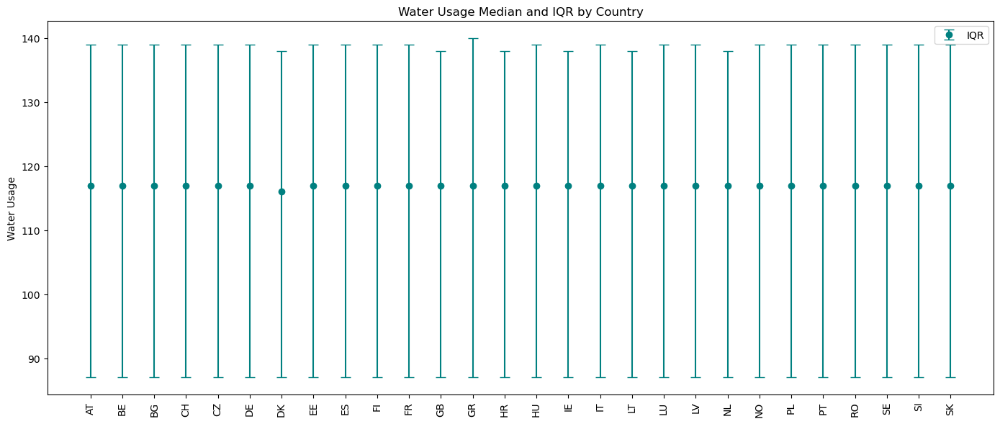

In [ ]:
plt.figure(figsize=(14,6))

# Collecting all values
x_vals = list(range(len(water_summary)))
medians = water_summary['50%'].values
lower_err = medians - water_summary['25%'].values
upper_err = water_summary['75%'].values - medians

# Now plotting them all in one go
plt.errorbar(x_vals, medians, yerr=[lower_err, upper_err],
             fmt='o', color='teal', capsize=5, label='IQR')

plt.xticks(x_vals, water_summary.index, rotation=90)
plt.title("Water Usage Median and IQR by Country")
plt.ylabel("Water Usage")
plt.tight_layout()
plt.legend()
plt.show()

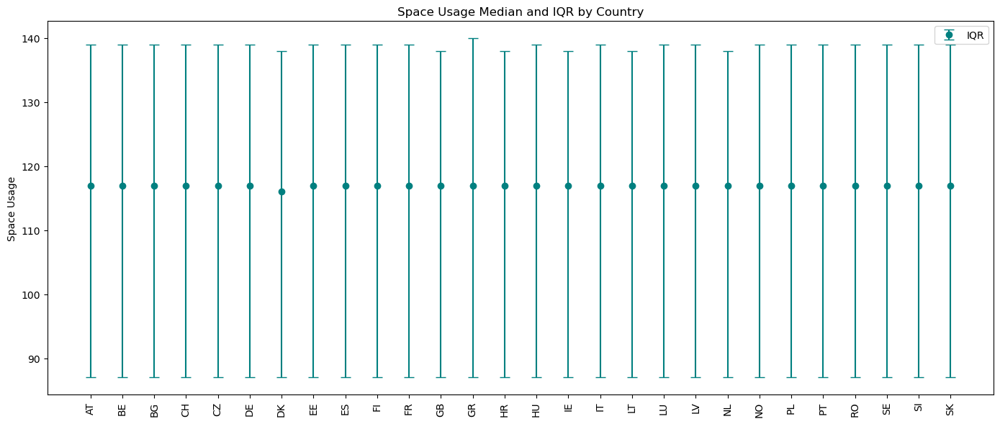

In [ ]:
plt.figure(figsize=(14,6))

# Collecting all values
x_vals = list(range(len(space_summary)))
medians = water_summary['50%'].values
lower_err = medians - water_summary['25%'].values
upper_err = water_summary['75%'].values - medians

# Now plotting them all in one go
plt.errorbar(x_vals, medians, yerr=[lower_err, upper_err],
             fmt='o', color='teal', capsize=5, label='IQR')

plt.xticks(x_vals, water_summary.index, rotation=90)
plt.title("Space Usage Median and IQR by Country")
plt.ylabel("Space Usage")
plt.tight_layout()
plt.legend()
plt.show()

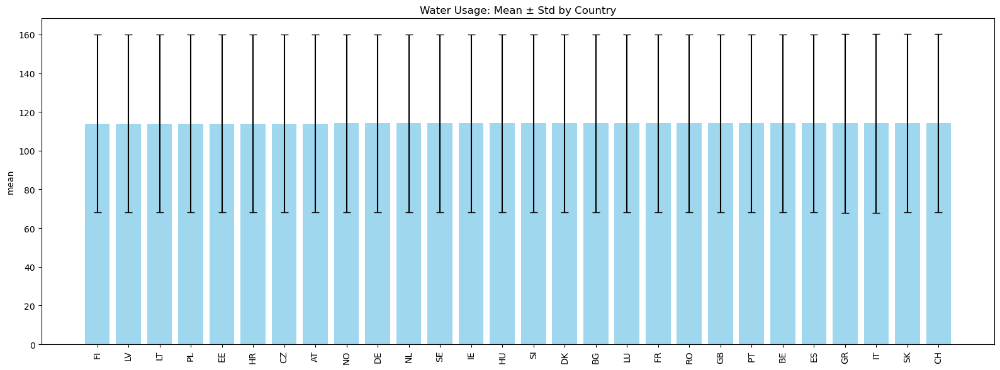

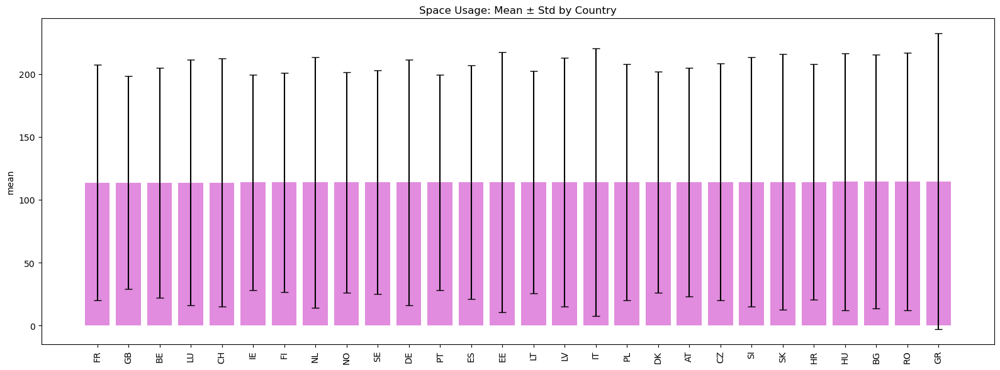

In [ ]:
def barplot_with_error(df, value_col, std_col, title, color):
    df_sorted = df.sort_values(value_col)
    plt.figure(figsize=(16, 6))
    plt.bar(df_sorted.index, df_sorted[value_col], yerr=df_sorted[std_col],
            capsize=4, color=color, alpha=0.8)
    plt.title(title)
    plt.ylabel(value_col)
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

# Now these will working fine:
barplot_with_error(water_summary, 'mean', 'std', "Water Usage: Mean ± Std by Country", 'skyblue')
barplot_with_error(space_summary, 'mean', 'std', "Space Usage: Mean ± Std by Country", 'orchid')

## Summary Findings: Water & Space Usage by Country

### 💧 Water Usage
- **Very consistent** across all countries (~114 L mean).
- **Standard deviation** around 46, indicating similar variability.
- **Min values** mostly at 10 or 11; **max values** range ~260–269.
- Likely **modeled or normalized data** due to high uniformity.

### 🏠 Space Heating Usage
- **More variation** than water usage.
- **Means** hover around 114, but **standard deviations** vary more (85–117).
- **Min value** is 1 for all — possibly baseline or inactive periods.
- **Max values** range widely (450–687), showing **greater diversity in heating needs** (e.g., colder climates like GR, IT, EE).

> 🇪🇺 Overall, water usage appears standardized, while space heating reflects more **regional and climatic variation**.


In [ ]:
df_cleaned = df.dropna(subset=['water'])

# Now performing the aggregation after cleaning the data
water_stats = df_cleaned.groupby(['country', 'profile_type'])['water'].agg([
    'mean', 'std', 'min', 'median', 
    lambda x: x.quantile(0.25), 
    lambda x: x.quantile(0.75), 
    'max'
]).reset_index()

# Using Rename columns for clarity
water_stats.columns = [
    'country', 'profile_type', 'water_mean', 'water_std', 'water_min', 'water_median', 
    'water_25%', 'water_75%', 'water_max'
]

# Droping rows where all water statistics are zero
water_stats_cleaned = water_stats[(water_stats['water_mean'] != 0) | 
                                  (water_stats['water_std'] != 0) | 
                                  (water_stats['water_min'] != 0) | 
                                  (water_stats['water_median'] != 0) | 
                                  (water_stats['water_25%'] != 0) | 
                                  (water_stats['water_75%'] != 0) | 
                                  (water_stats['water_max'] != 0)].reset_index(drop=True)

# Mapping profile_type codes to Full Building Type names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}

# Avoiding SettingWithCopyWarning
water_stats_cleaned = water_stats_cleaned.copy()

# Adding Full Building Type column
water_stats_cleaned['Full Building Type'] = water_stats_cleaned['profile_type'].map(profile_type_mapping)

# Starting of the HTML string
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 8px;
        text-align: center;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
    .separator-row td {
        border: none;
        height: 1px;
        background-color: #ccc;
        padding: 0;
    }
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>Water Mean</th>
            <th>Water Std</th>
            <th>Water Min</th>
            <th>Water Median</th>
            <th>Water 25%</th>
            <th>Water 75%</th>
            <th>Water Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Using Loop through countries and build rows with rowspan for country
for country, group in water_stats_cleaned.groupby('country'):
    rowspan = len(group)
    first_row = True
    for _, row in group.iterrows():
        html += "<tr>"
        if first_row:
            html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
            first_row = False
        html += f"<td>{row['Full Building Type']}</td>"
        html += f"<td>{row['profile_type']}</td>"
        html += f"<td>{row['water_mean']:.3f}</td>"
        html += f"<td>{row['water_std']:.4f}</td>"
        html += f"<td>{row['water_min']}</td>"
        html += f"<td>{row['water_median']}</td>"
        html += f"<td>{row['water_25%']}</td>"
        html += f"<td>{row['water_75%']}</td>"
        html += f"<td>{row['water_max']}</td>"
        html += "</tr>\n"

    # Adding a thin, light separator row after each country group
    html += f"<tr class='separator-row'><td colspan='10'></td></tr>\n"

# Using Close table body and table
html += "</tbody></table>"

# Displaying the final HTML table
display(HTML(html))

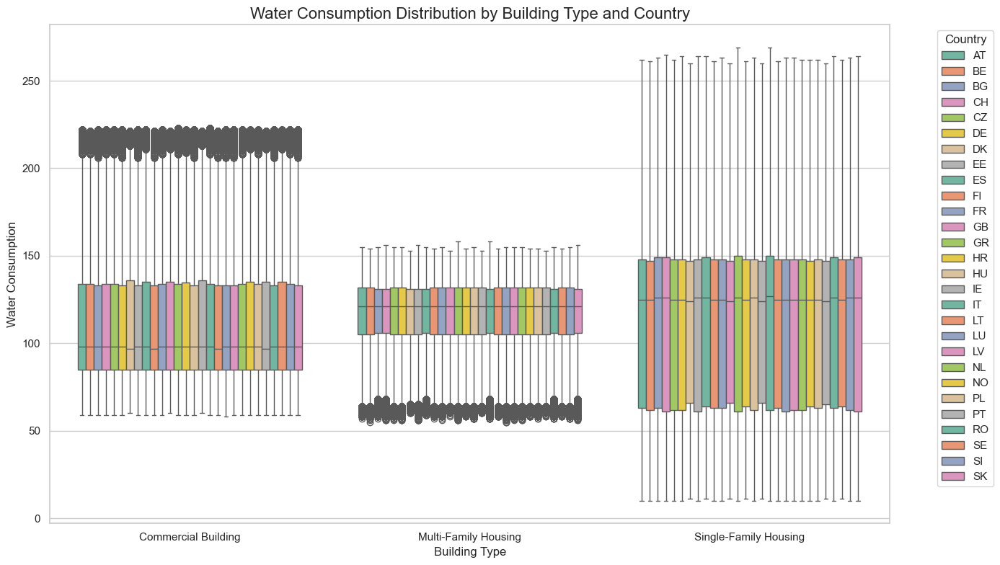

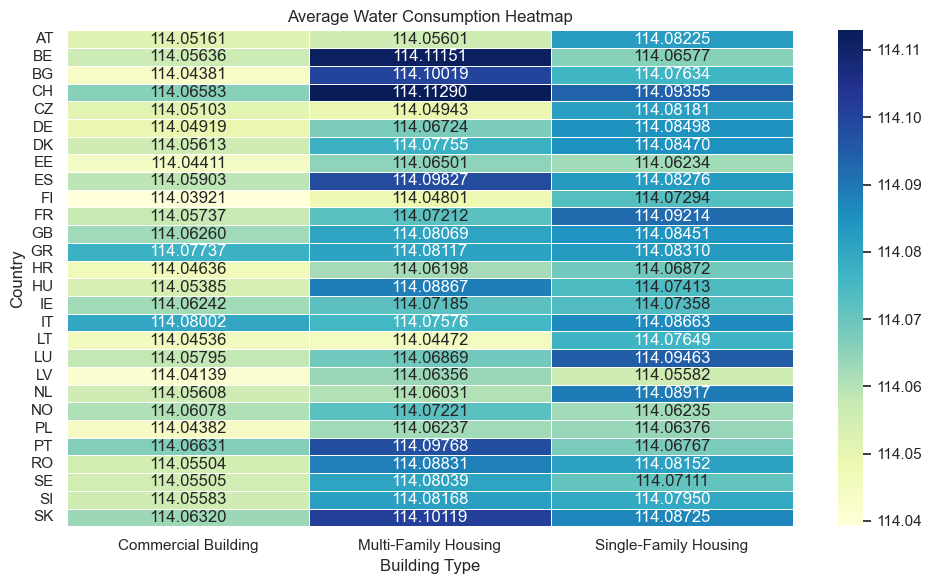

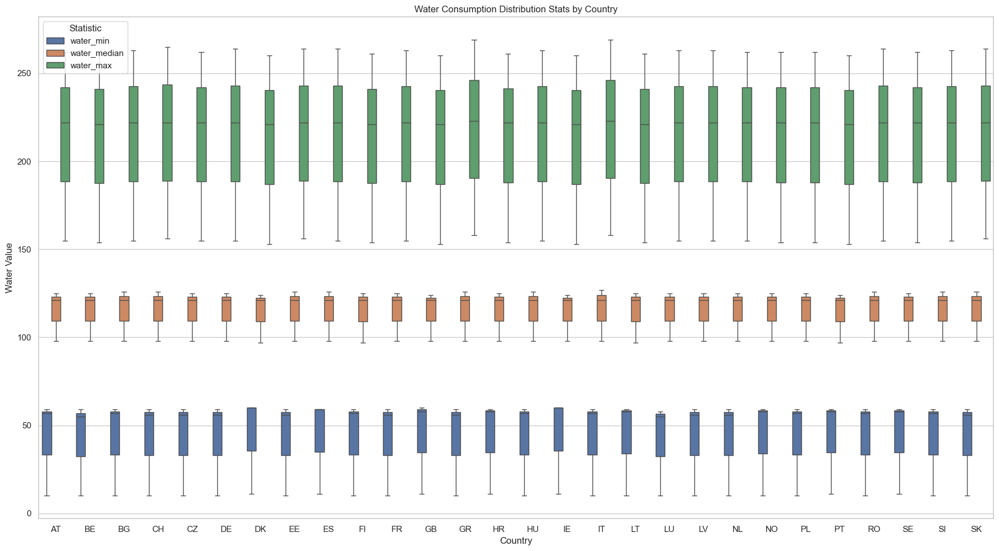

In [ ]:
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}
df_cleaned['Full Building Type'] = df_cleaned['profile_type'].map(profile_type_mapping)

# Using Set Seaborn style
sns.set(style="whitegrid")

# Creating the boxplot
plt.figure(figsize=(14, 8))
sns.boxplot(
    data=df_cleaned,
    x='Full Building Type',
    y='water',
    hue='country',
    palette='Set2'
)

# Using Titles and labels
plt.title('Water Consumption Distribution by Building Type and Country', fontsize=16)
plt.xlabel('Building Type', fontsize=12)
plt.ylabel('Water Consumption', fontsize=12)
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')

# Implementing Layout tweak for clarity
plt.tight_layout()
plt.show()


# Pivot for heatmap
heatmap_data = df_cleaned.groupby(['country', 'Full Building Type'])['water'].mean().unstack()

plt.figure(figsize=(10, 6))
sns.heatmap(
    heatmap_data, 
    annot=True, 
    cmap='YlGnBu', 
    fmt=".5f", 
    linewidths=0.5
)

plt.title('Average Water Consumption Heatmap')
plt.ylabel('Country')
plt.xlabel('Building Type')
plt.tight_layout()
plt.show()


# Using Melt dataframe for easier plotting
melted_df = water_stats_cleaned.melt(
    id_vars=['country', 'Full Building Type'], 
    value_vars=['water_min', 'water_median', 'water_max'],
    var_name='Statistic', 
    value_name='Water Value'
)

plt.figure(figsize=(18, 10))
sns.boxplot(
    data=melted_df, 
    x='country', 
    y='Water Value', 
    hue='Statistic'
)

plt.title('Water Consumption Distribution Stats by Country')
plt.xlabel('Country')
plt.ylabel('Water Value')
plt.legend(title='Statistic')
plt.tight_layout()
plt.show()

In [ ]:
df_cleaned['hour'] = df_cleaned['cet_cest_timestamp'].dt.hour + 1
hourly_country_stats = df_cleaned.groupby(
    ['country', 'profile_type', 'hour']
)['water'].agg(
    water_mean='mean',
    water_std='std',
    water_min='min',
    water_median='median',
    water_25=lambda x: x.quantile(0.25),
    water_75=lambda x: x.quantile(0.75),
    water_max='max'
).reset_index()

# Mapping profile_type codes to Full Building Type names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}

# Copying to avoid SettingWithCopyWarning
hourly_country_stats = hourly_country_stats.copy()

# Adding Full Building Type column
hourly_country_stats['Full Building Type'] = hourly_country_stats['profile_type'].map(profile_type_mapping)

# Using Counter to limit number of displayed rows
max_rows_to_display = 20
row_count = 0

# Starting of the HTML string
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
        margin-bottom: 20px;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 6px;
        text-align: center;
        font-size: 13px;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
    .separator-row td {
        border: none;
        height: 1px;
        background-color: #ccc;
        padding: 0;
    }
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Hour</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>Water Mean</th>
            <th>Water Std</th>
            <th>Water Min</th>
            <th>Water Median</th>
            <th>Water 25%</th>
            <th>Water 75%</th>
            <th>Water Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Using Loop through countries and build rows with rowspan for country
for country, group in hourly_country_stats.groupby('country'):
    for hour, hour_group in group.groupby('hour'):
        rowspan = len(hour_group)
        first_row = True
        for _, row in hour_group.iterrows():
            if row_count >= max_rows_to_display:
                break
            html += "<tr>"
            if first_row:
                html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
                html += f"<td rowspan='{rowspan}'>{hour}</td>"
                first_row = False
            html += f"<td>{row['Full Building Type']}</td>"
            html += f"<td>{row['profile_type']}</td>"
            html += f"<td>{row['water_mean']:.3f}</td>"
            html += f"<td>{row['water_std']:.4f}</td>"
            html += f"<td>{row['water_min']}</td>"
            html += f"<td>{row['water_median']}</td>"
            html += f"<td>{row['water_25']}</td>"
            html += f"<td>{row['water_75']}</td>"
            html += f"<td>{row['water_max']}</td>"
            html += "</tr>\n"
            row_count += 1
        if row_count >= max_rows_to_display:
            break
    if row_count >= max_rows_to_display:
        break

# Implementing Close table body and table
html += "</tbody></table>"

# Displaying the final HTML table
display(HTML(html))


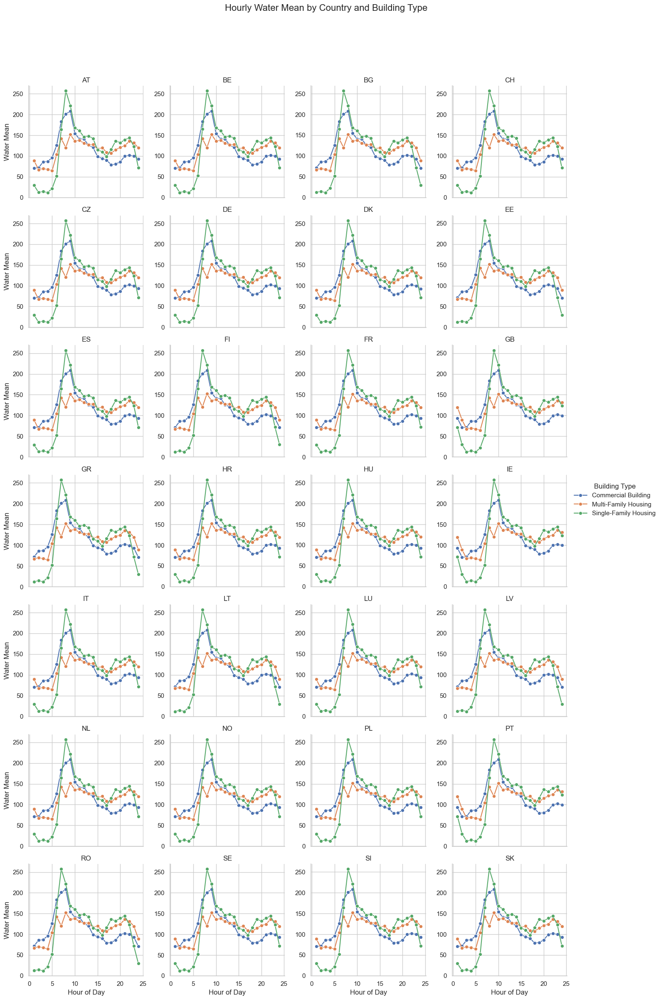

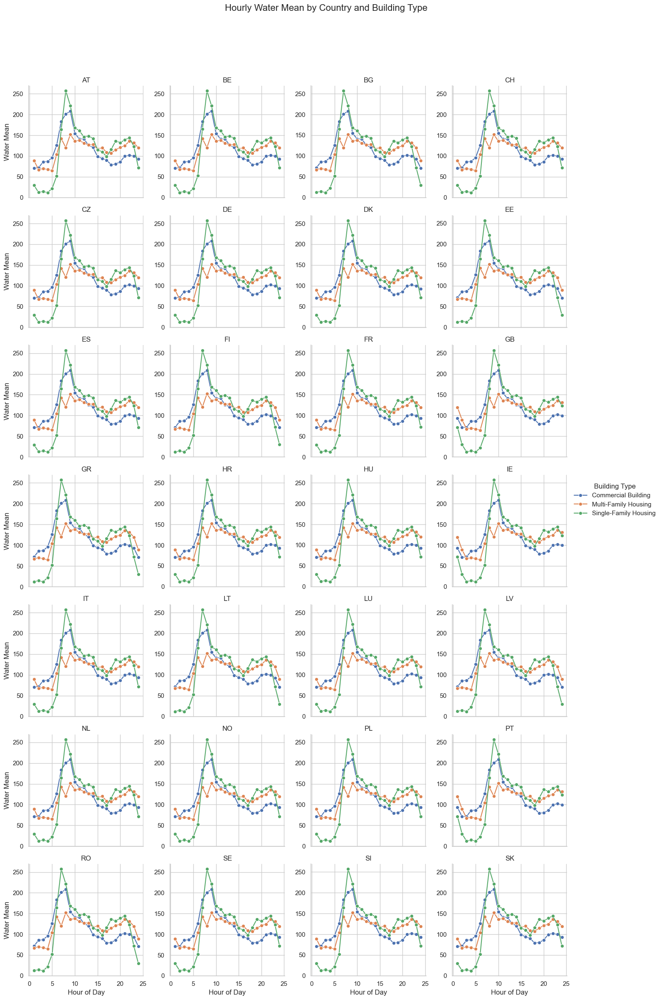

In [ ]:
# Setting up the FacetGrid
g = sns.FacetGrid(hourly_country_stats, col="country", col_wrap=4, height=3.5, sharey=False)

# Mapping lineplots to each facet
g.map_dataframe(sns.lineplot, x="hour", y="water_mean", hue="Full Building Type", marker='o')

# Adding titles and labels
g.add_legend(title="Building Type")
g.set_axis_labels("Hour of Day", "Water Mean")
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Hourly Water Mean by Country and Building Type", fontsize=16)

plt.show()

# Setting up the FacetGrid
g = sns.FacetGrid(hourly_country_stats, col="country", col_wrap=4, height=3.5, sharey=False)

# Mapping lineplots to each facet
g.map_dataframe(sns.lineplot, x="hour", y="water_mean", hue="Full Building Type", marker='o')

# Adding titles and labels
g.add_legend(title="Building Type")
g.set_axis_labels("Hour of Day", "Water Mean")
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Hourly Water Mean by Country and Building Type", fontsize=16)

plt.show()

In [15]:
fig = px.line(hourly_country_stats, 
              x="hour", y="water_mean", 
              color="Full Building Type", 
              facet_col="country", 
              facet_col_wrap=4,
              title="Hourly Water Mean by Country and Building Type")

fig.update_layout(height=900, width=1200)
fig.show()

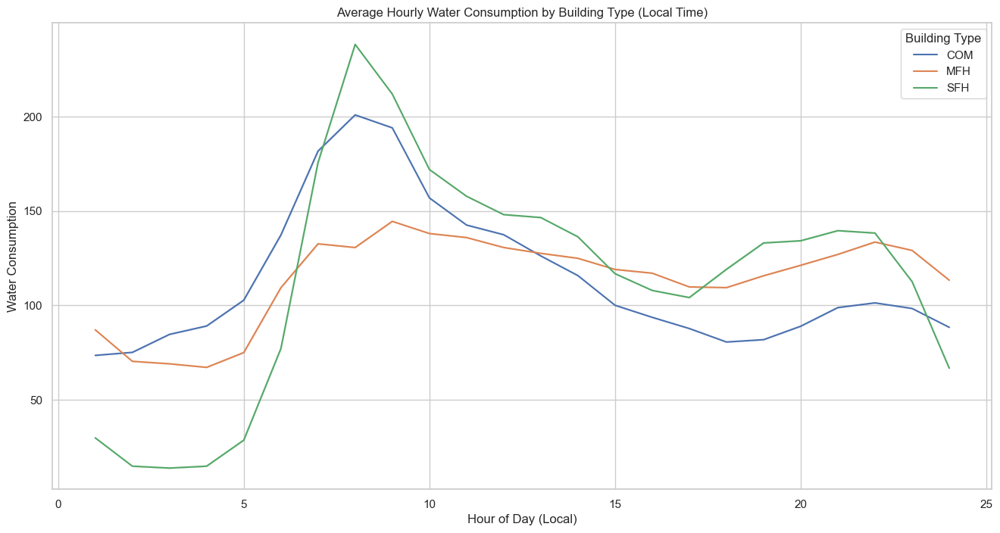

In [16]:
df['local_hour'] = pd.to_datetime(df['cet_cest_timestamp']).dt.hour + 1

plt.figure(figsize=(16, 8))
sns.lineplot(data=df, x='local_hour', y='water', hue='profile_type', estimator='mean')
plt.title('Average Hourly Water Consumption by Building Type (Local Time)')
plt.xlabel('Hour of Day (Local)')
plt.ylabel('Water Consumption')
plt.legend(title='Building Type')
plt.show()


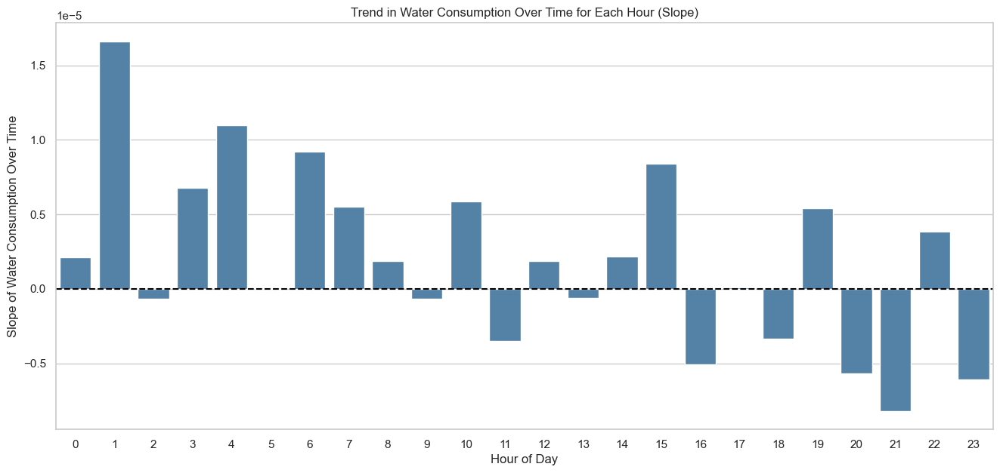

In [ ]:
# Converting 'cet_cest_timestamp' to datetime and extract date and hour
df['date'] = pd.to_datetime(df['cet_cest_timestamp']).dt.date
df['hour'] = pd.to_datetime(df['cet_cest_timestamp']).dt.hour

# Grouping by date and hour to get average water consumption at each hour of each day
daily_hourly_mean = df.groupby(['date', 'hour'])['water'].mean().reset_index()

# For each hour, compute trend (slope over days)
results = []

for h in range(24):
    temp = daily_hourly_mean[daily_hourly_mean['hour'] == h].copy()  # Create a copy to avoid SettingWithCopyWarning
    if len(temp) > 1:
        # Converting date to ordinal (numeric value) for trend calculation
        temp['date_num'] = pd.to_datetime(temp['date']).map(pd.Timestamp.toordinal)
        
        # Performing linear regression to compute the trend (slope)
        slope, intercept, r_value, p_value, std_err = linregress(temp['date_num'], temp['water'])
        results.append({'hour': h, 'slope': slope, 'p_value': p_value})

# Creating DataFrame of trends
trend_df = pd.DataFrame(results)

# Plotting barplot of slopes per hour
plt.figure(figsize=(16, 7))
sns.barplot(data=trend_df, x='hour', y='slope', color='steelblue')  # or any color you like
plt.axhline(0, color='black', linestyle='--')
plt.title('Trend in Water Consumption Over Time for Each Hour (Slope)')
plt.xlabel('Hour of Day')
plt.ylabel('Slope of Water Consumption Over Time')
plt.show()

In [ ]:
# Extracting week number (ISO week)
df_cleaned['week'] = df_cleaned['cet_cest_timestamp'].dt.isocalendar().week

# Grouping by country, profile type, and week (no year) to compute stats
weekly_country_stats = df_cleaned.groupby(
    ['country', 'profile_type', 'week']
)['water'].agg(
    water_mean='mean',
    water_std='std',
    water_min='min',
    water_median='median',
    water_25=lambda x: x.quantile(0.25),
    water_75=lambda x: x.quantile(0.75),
    water_max='max'
).reset_index()

# Mapping profile_type codes to full building type names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}

# Adding Full Building Type column
weekly_country_stats['Full Building Type'] = weekly_country_stats['profile_type'].map(profile_type_mapping)

# Using Limit number of displayed rows
max_rows_to_display = 20
row_count = 0

# Starting of the HTML string
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
        margin-bottom: 20px;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 6px;
        text-align: center;
        font-size: 13px;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Week</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>Water Mean</th>
            <th>Water Std</th>
            <th>Water Min</th>
            <th>Water Median</th>
            <th>Water 25%</th>
            <th>Water 75%</th>
            <th>Water Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Using Loop through countries and build rows with rowspan for country and week
for country, group in weekly_country_stats.groupby('country'):
    for week, week_group in group.groupby('week'):
        rowspan = len(week_group)
        first_row = True
        for _, row in week_group.iterrows():
            if row_count >= max_rows_to_display:
                break
            html += "<tr>"
            if first_row:
                html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
                html += f"<td rowspan='{rowspan}'>{week}</td>"
                first_row = False
            html += f"<td>{row['Full Building Type']}</td>"
            html += f"<td>{row['profile_type']}</td>"
            html += f"<td>{row['water_mean']:.3f}</td>"
            html += f"<td>{row['water_std']:.4f}</td>"
            html += f"<td>{row['water_min']}</td>"
            html += f"<td>{row['water_median']}</td>"
            html += f"<td>{row['water_25']}</td>"
            html += f"<td>{row['water_75']}</td>"
            html += f"<td>{row['water_max']}</td>"
            html += "</tr>\n"
            row_count += 1
        if row_count >= max_rows_to_display:
            break
    if row_count >= max_rows_to_display:
        break

# Using Close table body and table
html += "</tbody></table>"

# Displaying the final HTML table
display(HTML(html))

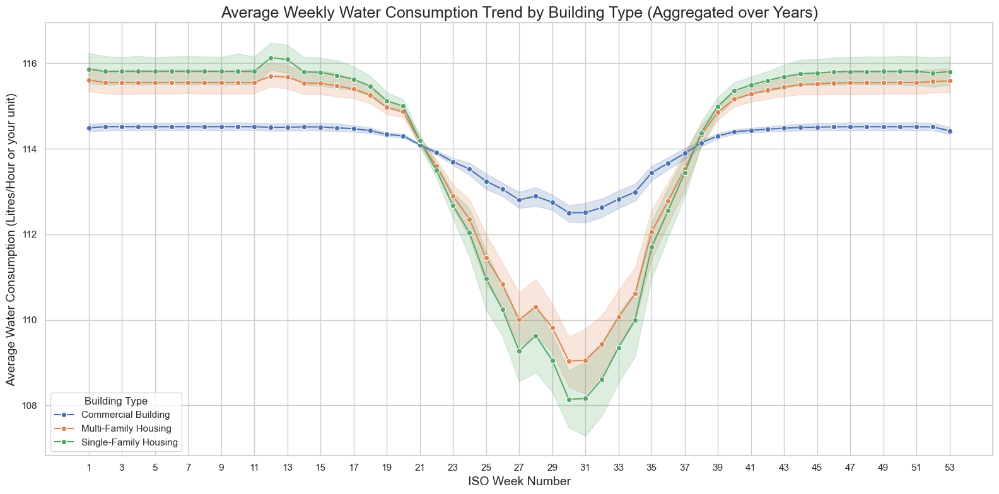

In [ ]:
sns.set(style="whitegrid")

# Using Plot: Weekly water consumption trend by Full Building Type
plt.figure(figsize=(16, 8))

# Lineplot for each building type over 52 weeks
sns.lineplot(
    data=weekly_country_stats,
    x='week',
    y='water_mean',
    hue='Full Building Type',
    marker='o'
)

# Customizing plot
plt.title('Average Weekly Water Consumption Trend by Building Type (Aggregated over Years)', fontsize=18)
plt.xlabel('ISO Week Number', fontsize=14)
plt.ylabel('Average Water Consumption (Litres/Hour or your unit)', fontsize=14)
plt.xticks(range(1, 54, 2))
plt.legend(title='Building Type')
plt.grid(True)
plt.tight_layout()

plt.show()


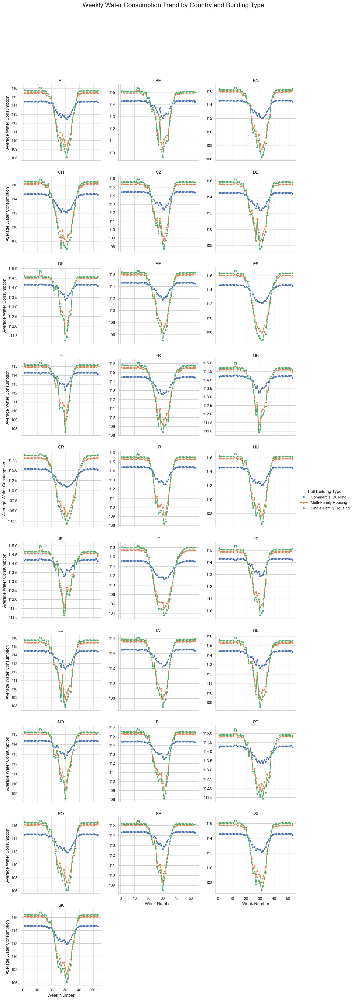

In [20]:
g = sns.FacetGrid(weekly_country_stats, col="country", hue="Full Building Type", col_wrap=3, height=4, sharey=False)
g.map(sns.lineplot, "week", "water_mean", marker="o")
g.add_legend()
g.set_titles("{col_name}")
g.set_axis_labels("Week Number", "Average Water Consumption")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Weekly Water Consumption Trend by Country and Building Type", fontsize=18)
plt.show()


C:\Users\oppor\AppData\Local\Temp\ipykernel_3832\2990376509.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



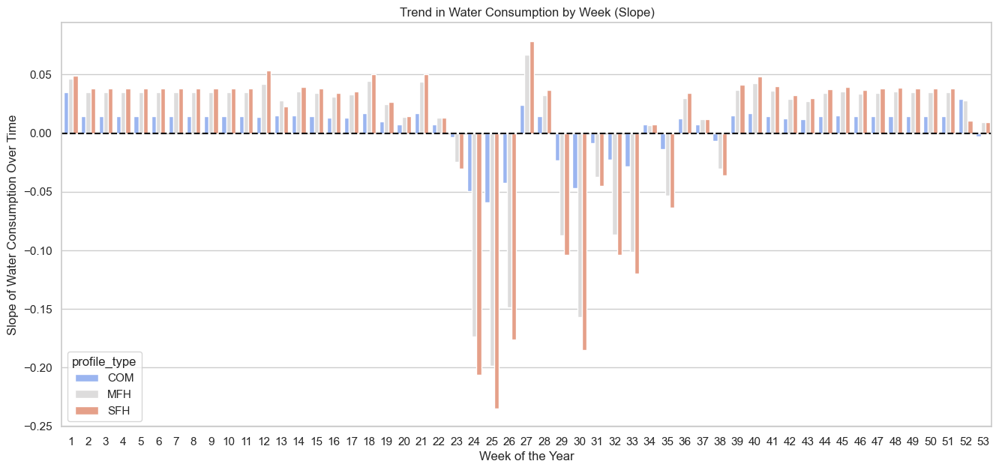

In [ ]:
# Step 1: Ensuring the 'cet_cest_timestamp' is in datetime format and compute weekly stats
df_cleaned['cet_cest_timestamp'] = pd.to_datetime(df_cleaned['cet_cest_timestamp'])
df_cleaned['week'] = df_cleaned['cet_cest_timestamp'].dt.isocalendar().week
df_cleaned['year'] = df_cleaned['cet_cest_timestamp'].dt.isocalendar().year

# Grouping by country, profile type, year, and week to compute average water consumption
weekly_country_stats = df_cleaned.groupby(
    ['country', 'profile_type', 'year', 'week']
)['water'].mean().reset_index()

# Step 2: Using Function to calculate the linear regression slope (trend) for each week
def calculate_slope(group):
    # Performing linear regression only if there are multiple years of data for that week
    if len(group) > 1:
        slope, intercept, r_value, p_value, std_err = linregress(group['year'], group['water'])
        return pd.Series({'slope': slope, 'p_value': p_value})
    else:
        return pd.Series({'slope': None, 'p_value': None})

# Step 3: Applying the linear regression function to each group (country, profile_type, week)
# Explicitly select only the relevant columns before applying the function
# Using include_groups=False to prevent grouping columns from being part of the result

trend_df = (weekly_country_stats[['country', 'profile_type', 'week', 'year', 'water']]
            .groupby(['country', 'profile_type', 'week'], group_keys=False)
            .apply(lambda group: calculate_slope(group[['year', 'water']]))
            .reset_index())

# Step 4: Plotting the trends (slope for each week)
plt.figure(figsize=(16, 7))
sns.barplot(data=trend_df, x='week', y='slope', hue='profile_type', errorbar=None, palette='coolwarm')
plt.axhline(0, color='black', linestyle='--')
plt.title('Trend in Water Consumption by Week (Slope)')
plt.xlabel('Week of the Year')
plt.ylabel('Slope of Water Consumption Over Time')
plt.show()

In [ ]:
# Ensureing 'month' and 'year' columns are correctly created
df_cleaned['month'] = df_cleaned['cet_cest_timestamp'].dt.month

# Grouping by country, profile_type, and month (across all years) to compute stats
monthly_country_stats = df_cleaned.groupby(
    ['country', 'profile_type', 'month']
)['water'].agg(
    water_mean='mean',
    water_std='std',
    water_min='min',
    water_median='median',
    water_25=lambda x: x.quantile(0.25),
    water_75=lambda x: x.quantile(0.75),
    water_max='max'
).reset_index()

# Mapping profile_type codes to Full Building Type names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}

# Copying to avoid SettingWithCopyWarning
monthly_country_stats = monthly_country_stats.copy()

# Adding Full Building Type column
monthly_country_stats['Full Building Type'] = monthly_country_stats['profile_type'].map(profile_type_mapping)

# Using Counter to limit number of displayed rows
max_rows_to_display = 20
row_count = 0

# Starting of the HTML string
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
        margin-bottom: 20px;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 6px;
        text-align: center;
        font-size: 13px;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
    .separator-row td {
        border: none;
        height: 1px;
        background-color: #ccc;
        padding: 0;
    }
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Month</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>Water Mean</th>
            <th>Water Std</th>
            <th>Water Min</th>
            <th>Water Median</th>
            <th>Water 25%</th>
            <th>Water 75%</th>
            <th>Water Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Using Loop through countries and build rows with rowspan for country and month
for country, group in monthly_country_stats.groupby('country'):
    for month, month_group in group.groupby('month'):
        rowspan = len(month_group)
        first_row = True
        for _, row in month_group.iterrows():
            if row_count >= max_rows_to_display:
                break
            html += "<tr>"
            if first_row:
                html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
                html += f"<td rowspan='{rowspan}'>{month}</td>"
                first_row = False
            html += f"<td>{row['Full Building Type']}</td>"
            html += f"<td>{row['profile_type']}</td>"
            html += f"<td>{row['water_mean']:.3f}</td>"
            html += f"<td>{row['water_std']:.4f}</td>"
            html += f"<td>{row['water_min']}</td>"
            html += f"<td>{row['water_median']}</td>"
            html += f"<td>{row['water_25']}</td>"
            html += f"<td>{row['water_75']}</td>"
            html += f"<td>{row['water_max']}</td>"
            html += "</tr>\n"
            row_count += 1
        if row_count >= max_rows_to_display:
            break
    if row_count >= max_rows_to_display:
        break

# Using Close table body and table
html += "</tbody></table>"

# Displaying the final HTML table
display(HTML(html))

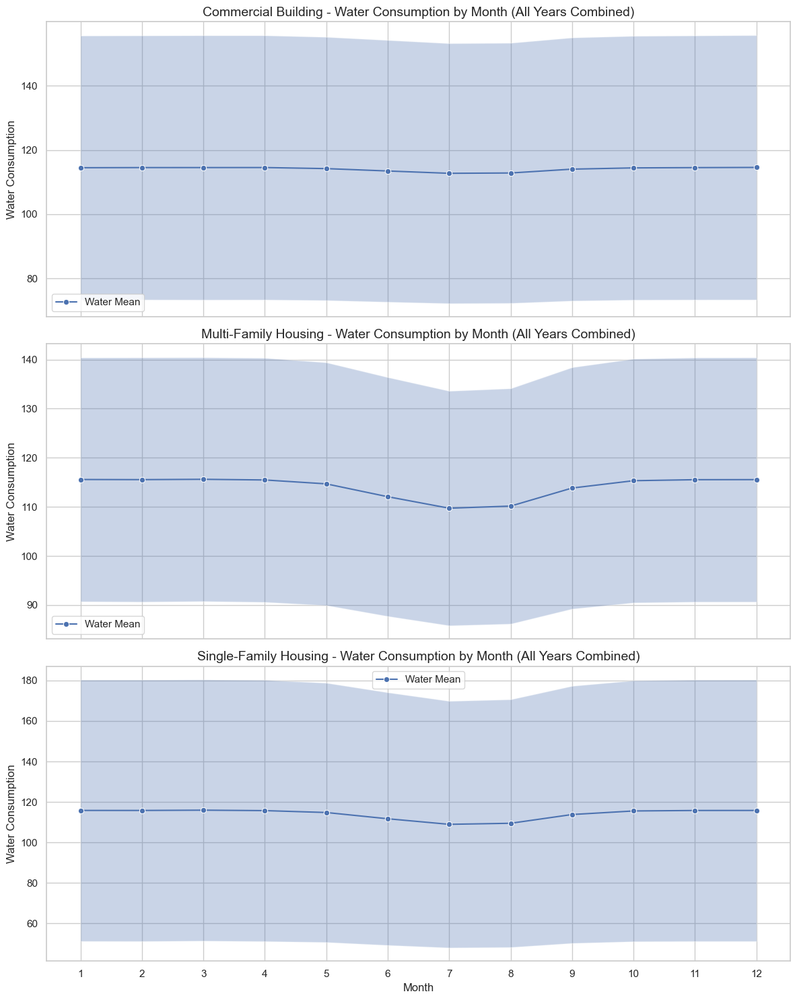

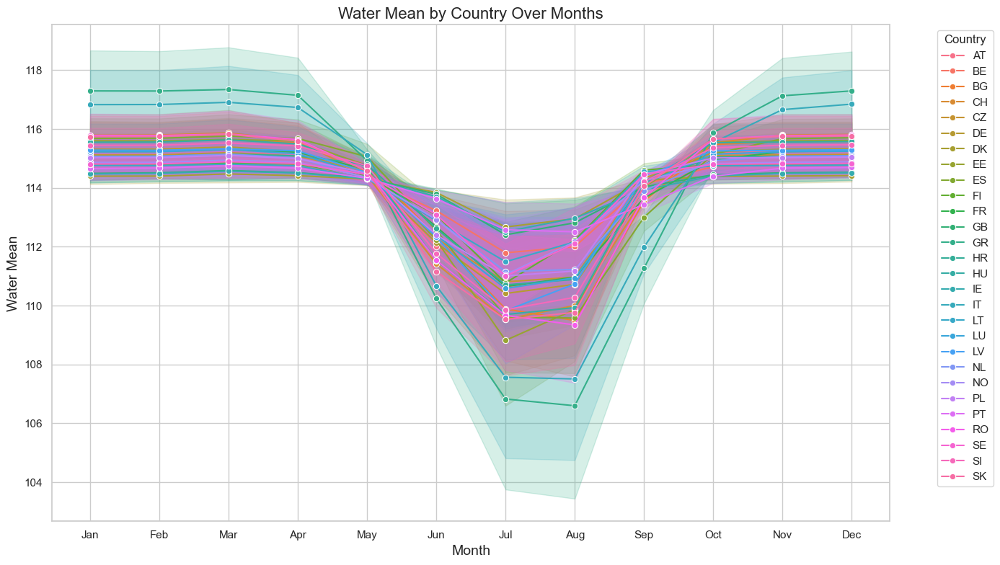

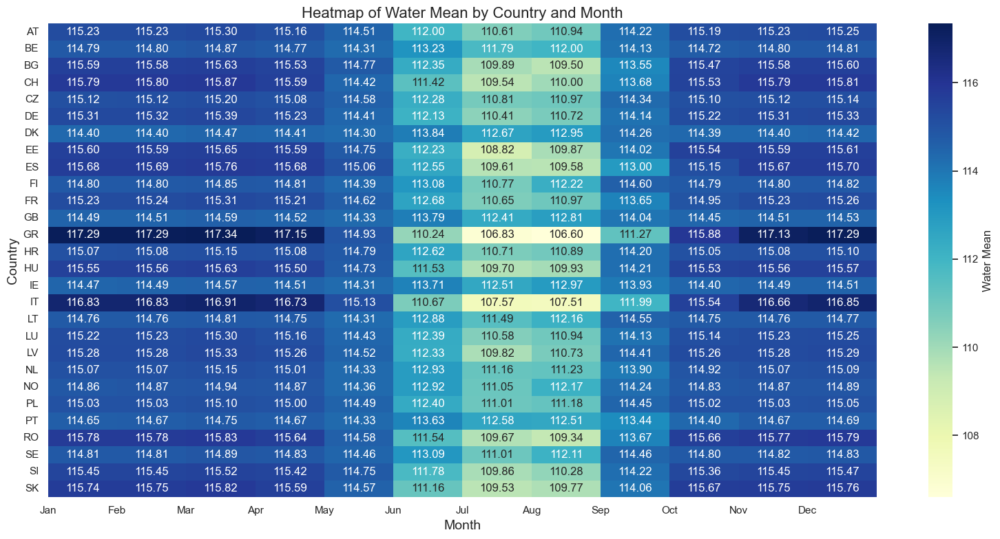

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Ensuring timestamp is in datetime
df['cet_cest_timestamp'] = pd.to_datetime(df['cet_cest_timestamp'])

# Extracting month number
df['month'] = df['cet_cest_timestamp'].dt.month

# Mapping profile types to full names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}
df['Full Building Type'] = df['profile_type'].map(profile_type_mapping)

# Grouping by Full Building Type and month to get mean and std
monthly_stats = df.groupby(['Full Building Type', 'month']).agg(
    water_mean=('water', 'mean'),
    water_std=('water', 'std'),
    space_mean=('space', 'mean'),
    space_std=('space', 'std')
).reset_index()

# Create subplots: one for each Full Building Type
building_types = monthly_stats['Full Building Type'].unique()
num_types = len(building_types)

# Setting up subplots grid
fig, axes = plt.subplots(num_types, 1, figsize=(12, 5 * num_types), sharex=True)

if num_types == 1:
    axes = [axes]  # if only one subplot, put it in a list for consistency

# Plotting each building type in a separate subplot
for ax, b_type in zip(axes, building_types):
    data = monthly_stats[monthly_stats['Full Building Type'] == b_type]
    sns.lineplot(data=data, x='month', y='water_mean', marker='o', ax=ax, label='Water Mean')
    ax.fill_between(data['month'], 
                    data['water_mean'] - data['water_std'], 
                    data['water_mean'] + data['water_std'], 
                    alpha=0.3)
    ax.set_title(f"{b_type} - Water Consumption by Month (All Years Combined)", fontsize=14)
    ax.set_xlabel("Month")
    ax.set_ylabel("Water Consumption")
    ax.set_xticks(range(1, 13))
    ax.legend()

plt.tight_layout()
plt.show()

import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the plot
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_country_stats, x='month', y='water_mean', hue='country', marker='o')

# Customizing the plot
plt.title('Water Mean by Country Over Months', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Water Mean', fontsize=14)
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()

# Showing the plot
plt.show()

import numpy as np

# Using Pivot the data to create a matrix for heatmap
heatmap_data = monthly_country_stats.pivot_table(index='country', columns='month', values='water_mean')

# Setting up the plot
plt.figure(figsize=(16, 8))
sns.heatmap(heatmap_data, annot=True, cmap='YlGnBu', fmt='.2f', cbar_kws={'label': 'Water Mean'})

# Customizing the plot
plt.title('Heatmap of Water Mean by Country and Month', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Country', fontsize=14)
plt.xticks(ticks=np.arange(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.tight_layout()

# Showing the plot
plt.show()


In [ ]:
from IPython.display import display, HTML
import pandas as pd

# Ensuring 'cet_cest_timestamp' is in datetime format
df_cleaned['cet_cest_timestamp'] = pd.to_datetime(df_cleaned['cet_cest_timestamp'])

# Extracting year from the timestamp
df_cleaned['year'] = df_cleaned['cet_cest_timestamp'].dt.year

# Grouping by country, profile type, and year to compute yearly stats
yearly_country_stats = df_cleaned.groupby(
    ['country', 'profile_type', 'year']
)['water'].agg(
    water_mean='mean',
    water_std='std',
    water_min='min',
    water_median='median',
    water_25=lambda x: x.quantile(0.25),
    water_75=lambda x: x.quantile(0.75),
    water_max='max'
).reset_index()

# Mapping profile_type codes to full building type names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}

# Adding 'Full Building Type' column
yearly_country_stats['Full Building Type'] = yearly_country_stats['profile_type'].map(profile_type_mapping)

# Using Limit number of displayed rows
max_rows_to_display = 20
row_count = 0

# Starting of the HTML string for table styling
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
        margin-bottom: 20px;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 6px;
        text-align: center;
        font-size: 13px;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Year</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>Water Mean</th>
            <th>Water Std</th>
            <th>Water Min</th>
            <th>Water Median</th>
            <th>Water 25%</th>
            <th>Water 75%</th>
            <th>Water Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Using Loop through countries and build rows with rowspan for country and year
for country, group in yearly_country_stats.groupby('country'):
    for year, year_group in group.groupby('year'):
        rowspan = len(year_group)
        first_row = True
        for _, row in year_group.iterrows():
            if row_count >= max_rows_to_display:
                break
            html += "<tr>"
            if first_row:
                html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
                html += f"<td rowspan='{rowspan}'>{year}</td>"
                first_row = False
            html += f"<td>{row['Full Building Type']}</td>"
            html += f"<td>{row['profile_type']}</td>"
            html += f"<td>{row['water_mean']:.3f}</td>"
            html += f"<td>{row['water_std']:.4f}</td>"
            html += f"<td>{row['water_min']}</td>"
            html += f"<td>{row['water_median']}</td>"
            html += f"<td>{row['water_25']}</td>"
            html += f"<td>{row['water_75']}</td>"
            html += f"<td>{row['water_max']}</td>"
            html += "</tr>\n"
            row_count += 1
        if row_count >= max_rows_to_display:
            break
    if row_count >= max_rows_to_display:
        break

# Using Close table body and table
html += "</tbody></table>"

# Displaying the final HTML table
display(HTML(html))

<Figure size 1200x800 with 0 Axes>

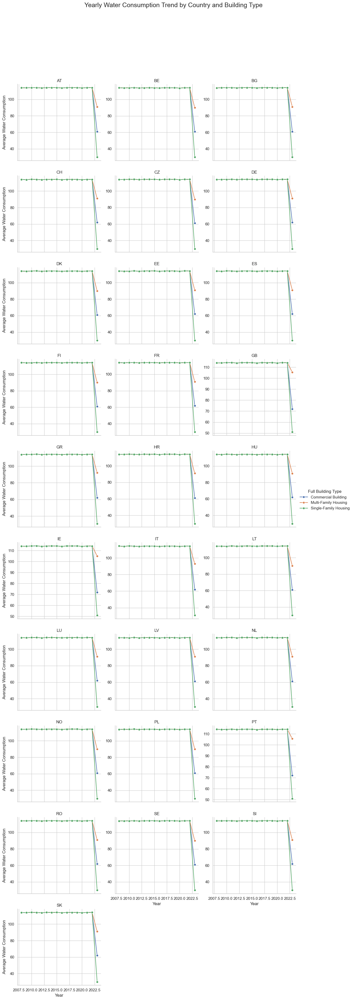

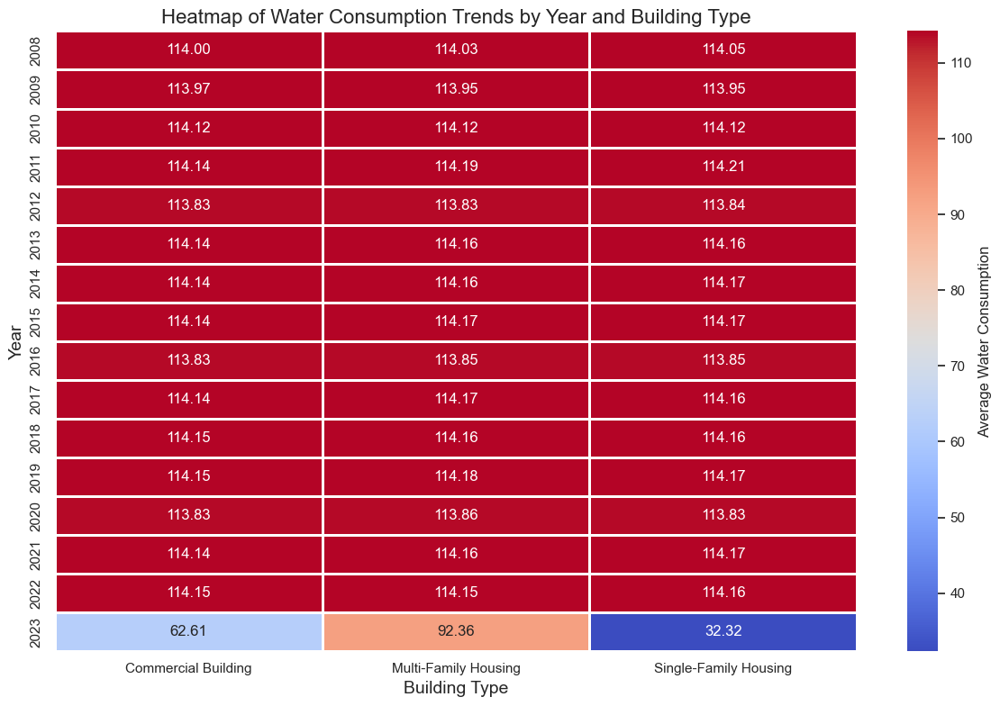

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting plot style
sns.set(style="whitegrid")

# Using Line Plot for Yearly Water Consumption Trend by Country and Building Type
plt.figure(figsize=(12, 8))
g = sns.FacetGrid(yearly_country_stats, col="country", hue="Full Building Type", col_wrap=3, height=4, sharey=False)
g.map(sns.lineplot, "year", "water_mean", marker="o")
g.add_legend()
g.set_titles("{col_name}")
g.set_axis_labels("Year", "Average Water Consumption")
g.fig.suptitle("Yearly Water Consumption Trend by Country and Building Type", fontsize=18)
plt.subplots_adjust(top=0.9)
plt.show()

# Using Bar Plot for Mean Water Consumption per Year for

# Using Pivot data for heatmap visualization
pivot_data = yearly_country_stats.pivot_table(
    index="year", 
    columns="Full Building Type", 
    values="water_mean", 
    aggfunc="mean"
)

# Heatmap for water consumption trends across years and building types
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_data, fmt=".2f",annot=True, cmap="coolwarm", cbar_kws={'label': 'Average Water Consumption'}, linewidths=1)
plt.title('Heatmap of Water Consumption Trends by Year and Building Type', fontsize=16)
plt.xlabel('Building Type', fontsize=14)
plt.ylabel('Year', fontsize=14)
plt.tight_layout()
plt.show()



In [ ]:
df_cleaned_space = df.dropna(subset=['space'])

# Now performing the aggregation after cleaning the data
space_stats = df_cleaned_space.groupby(['country', 'profile_type'])['space'].agg([
    'mean', 'std', 'min', 'median', 
    lambda x: x.quantile(0.25), 
    lambda x: x.quantile(0.75), 
    'max'
]).reset_index()

# Doing Rename columns for clarity
space_stats.columns = [
    'country', 'profile_type', 'space_mean', 'space_std', 'space_min', 'space_median', 
    'space_25%', 'space_75%', 'space_max'
]

# Dropping rows where all water statistics are zero
space_stats_cleaned = space_stats[(space_stats['space_mean'] != 0) | 
                                  (space_stats['space_std'] != 0) | 
                                  (space_stats['space_min'] != 0) | 
                                  (space_stats['space_median'] != 0) | 
                                  (space_stats['space_25%'] != 0) | 
                                  (space_stats['space_75%'] != 0) | 
                                  (space_stats['space_max'] != 0)].reset_index(drop=True)

# Mapping profile_type codes to Full Building Type names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}

# Avoiding SettingWithCopyWarning
space_stats_cleaned = space_stats_cleaned.copy()

# Adding Full Building Type column
space_stats_cleaned['Full Building Type'] = space_stats_cleaned['profile_type'].map(profile_type_mapping)

# Starting of the HTML string
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 8px;
        text-align: center;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
    .separator-row td {
        border: none;
        height: 1px;
        background-color: #ccc;
        padding: 0;
    }
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>space Mean</th>
            <th>space Std</th>
            <th>space Min</th>
            <th>space Median</th>
            <th>space 25%</th>
            <th>space 75%</th>
            <th>space Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Using Loop through countries and build rows with rowspan for country
for country, group in space_stats_cleaned.groupby('country'):
    rowspan = len(group)
    first_row = True
    for _, row in group.iterrows():
        html += "<tr>"
        if first_row:
            html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
            first_row = False
        html += f"<td>{row['Full Building Type']}</td>"
        html += f"<td>{row['profile_type']}</td>"
        html += f"<td>{row['space_mean']:.3f}</td>"
        html += f"<td>{row['space_std']:.4f}</td>"
        html += f"<td>{row['space_min']}</td>"
        html += f"<td>{row['space_median']}</td>"
        html += f"<td>{row['space_25%']}</td>"
        html += f"<td>{row['space_75%']}</td>"
        html += f"<td>{row['space_max']}</td>"
        html += "</tr>\n"

    # Adding a thin, light separator row after each country group
    html += f"<tr class='separator-row'><td colspan='10'></td></tr>\n"

# Using Close table body and table
html += "</tbody></table>"

# Displaying the final HTML table
display(HTML(html))

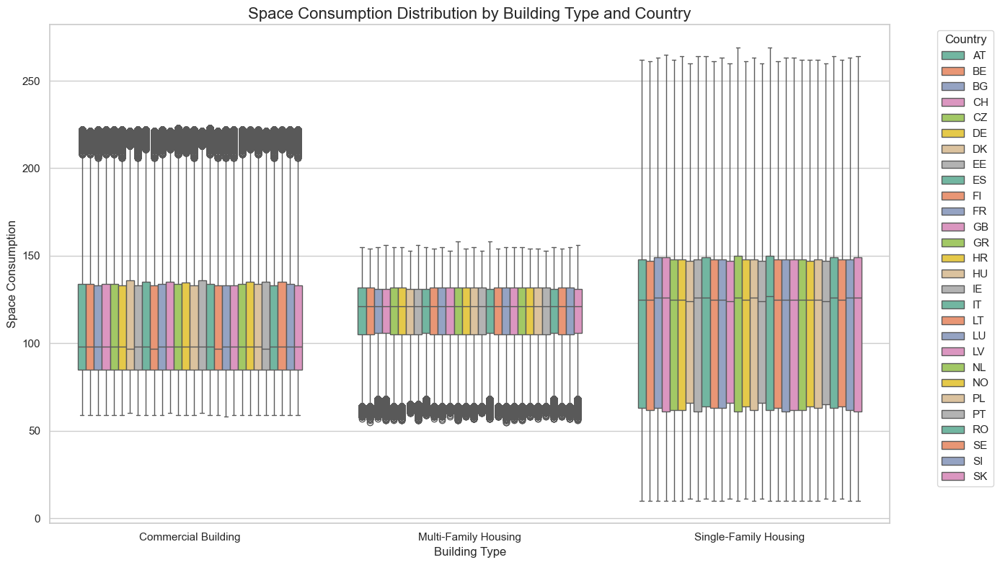

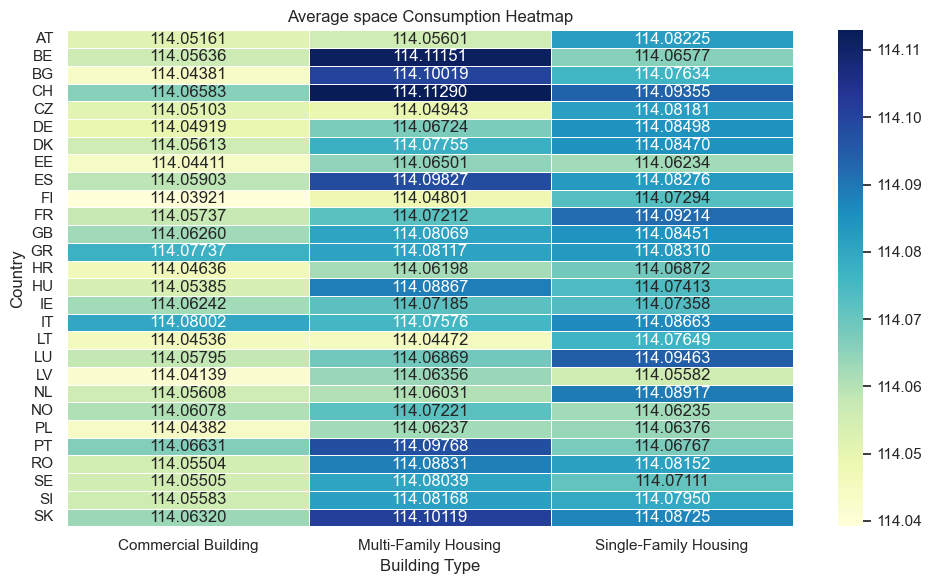

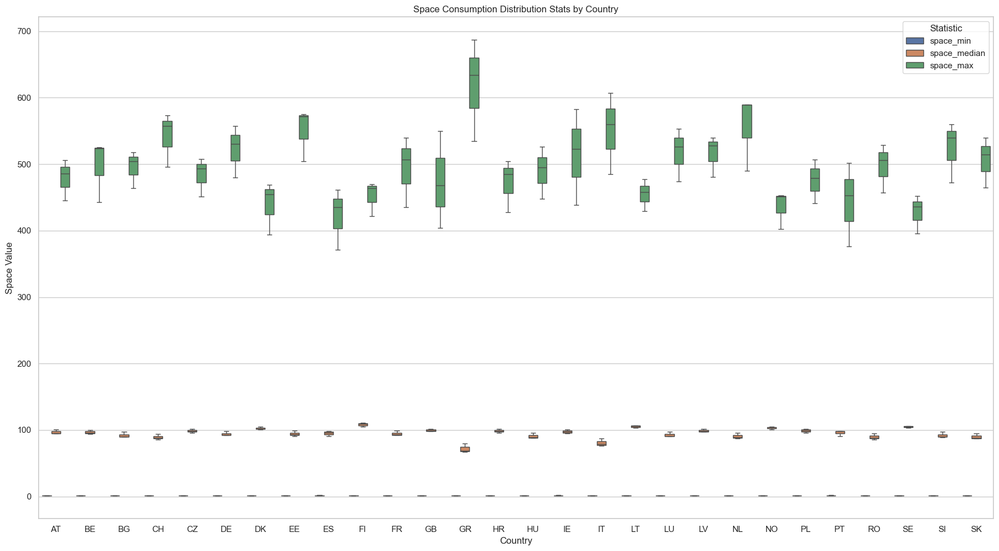

In [ ]:
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}
df_cleaned_space['Full Building Type'] = df_cleaned_space['profile_type'].map(profile_type_mapping)

# Setting Seaborn style
sns.set(style="whitegrid")

# Creating the boxplot
plt.figure(figsize=(14, 8))
sns.boxplot(
    data=df_cleaned_space,
    x='Full Building Type',
    y='water',
    hue='country',
    palette='Set2'
)

# For Titles and labels
plt.title('Space Consumption Distribution by Building Type and Country', fontsize=16)
plt.xlabel('Building Type', fontsize=12)
plt.ylabel('Space Consumption', fontsize=12)
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')

# Using Layout tweak for clarity
plt.tight_layout()
plt.show()


# Using Pivot for heatmap
heatmap_data_space = df_cleaned_space.groupby(['country', 'Full Building Type'])['water'].mean().unstack()

plt.figure(figsize=(10, 6))
sns.heatmap(
    heatmap_data_space, 
    annot=True, 
    cmap='YlGnBu', 
    fmt=".5f", 
    linewidths=0.5
)

plt.title('Average space Consumption Heatmap')
plt.ylabel('Country')
plt.xlabel('Building Type')
plt.tight_layout()
plt.show()


# Meltting dataframe for easier plotting
melted_df_space = space_stats_cleaned.melt(
    id_vars=['country', 'Full Building Type'], 
    value_vars=['space_min', 'space_median', 'space_max'],
    var_name='Statistic', 
    value_name='Space Value'
)

plt.figure(figsize=(18, 10))
sns.boxplot(
    data=melted_df_space, 
    x='country', 
    y='Space Value', 
    hue='Statistic'
)

plt.title('Space Consumption Distribution Stats by Country')
plt.xlabel('Country')
plt.ylabel('Space Value')
plt.legend(title='Statistic')
plt.tight_layout()
plt.show()

In [ ]:
df_cleaned_space['hour'] = df_cleaned_space['cet_cest_timestamp'].dt.hour + 1
hourly_country_stats_space = df_cleaned_space.groupby(
    ['country', 'profile_type', 'hour']
)['space'].agg(
    space_mean='mean',
    space_std='std',
    space_min='min',
    space_median='median',
    space_25=lambda x: x.quantile(0.25),
    space_75=lambda x: x.quantile(0.75),
    space_max='max'
).reset_index()

# Mapping profile_type codes to Full Building Type names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}

# Copying to avoid SettingWithCopyWarning
hourly_country_stats_space = hourly_country_stats_space.copy()

# Adding Full Building Type column
hourly_country_stats_space['Full Building Type'] = hourly_country_stats_space['profile_type'].map(profile_type_mapping)

# For Counter to limit number of displayed rows
max_rows_to_display = 20
row_count = 0

# Starting of the HTML string
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
        margin-bottom: 20px;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 6px;
        text-align: center;
        font-size: 13px;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
    .separator-row td {
        border: none;
        height: 1px;
        background-color: #ccc;
        padding: 0;
    }
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Hour</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>Water Mean</th>
            <th>Water Std</th>
            <th>Water Min</th>
            <th>Water Median</th>
            <th>Water 25%</th>
            <th>Water 75%</th>
            <th>Water Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Using Loop through countries and build rows with rowspan for country
for country, group in hourly_country_stats_space.groupby('country'):
    for hour, hour_group in group.groupby('hour'):
        rowspan = len(hour_group)
        first_row = True
        for _, row in hour_group.iterrows():
            if row_count >= max_rows_to_display:
                break
            html += "<tr>"
            if first_row:
                html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
                html += f"<td rowspan='{rowspan}'>{hour}</td>"
                first_row = False
            html += f"<td>{row['Full Building Type']}</td>"
            html += f"<td>{row['profile_type']}</td>"
            html += f"<td>{row['space_mean']:.3f}</td>"
            html += f"<td>{row['space_std']:.4f}</td>"
            html += f"<td>{row['space_min']}</td>"
            html += f"<td>{row['space_median']}</td>"
            html += f"<td>{row['space_25']}</td>"
            html += f"<td>{row['space_75']}</td>"
            html += f"<td>{row['space_max']}</td>"
            html += "</tr>\n"
            row_count += 1
        if row_count >= max_rows_to_display:
            break
    if row_count >= max_rows_to_display:
        break

# Close table body and table
html += "</tbody></table>"

# Displaying the final HTML table
display(HTML(html))


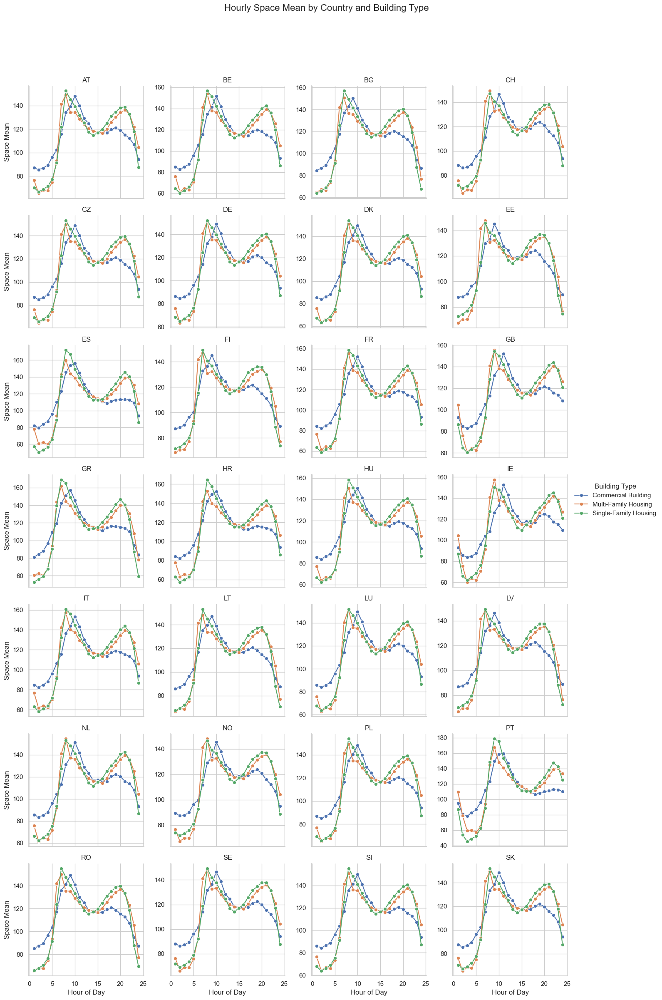

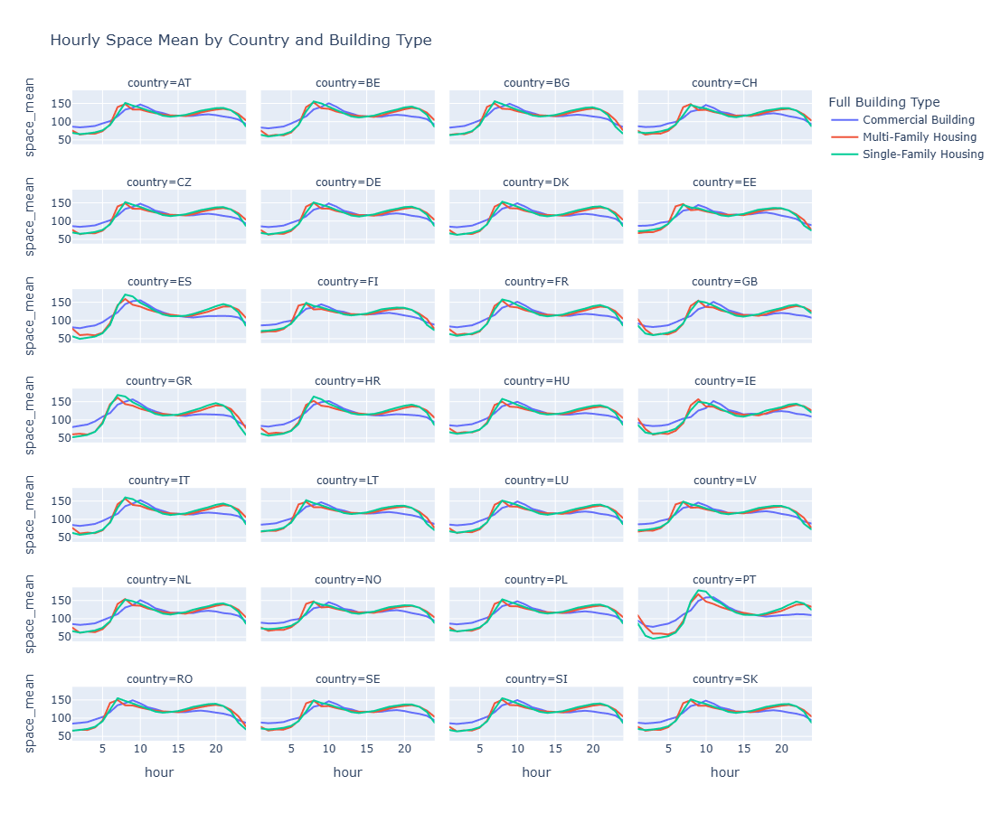

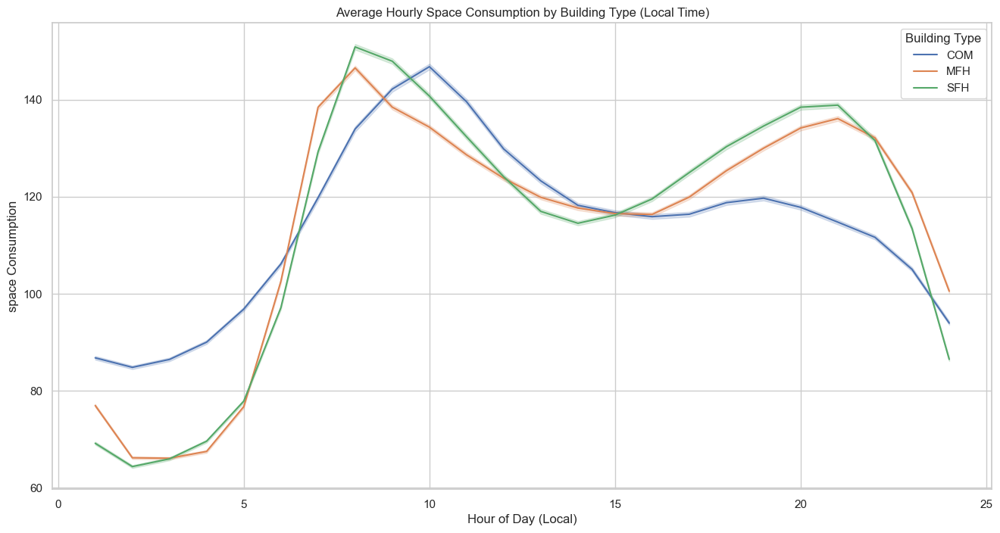

In [ ]:
# Setting up the FacetGrid
g = sns.FacetGrid(hourly_country_stats_space, col="country", col_wrap=4, height=3.5, sharey=False)

# Mapping lineplots to each facet
g.map_dataframe(sns.lineplot, x="hour", y="space_mean", hue="Full Building Type", marker='o')

# Adding titles and labels
g.add_legend(title="Building Type")
g.set_axis_labels("Hour of Day", "Space Mean")
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Hourly Space Mean by Country and Building Type", fontsize=16)

plt.show()

fig = px.line(hourly_country_stats_space, 
              x="hour", y="space_mean", 
              color="Full Building Type", 
              facet_col="country", 
              facet_col_wrap=4,
              title="Hourly Space Mean by Country and Building Type")

fig.update_layout(height=900, width=1200)
fig.show()

df['local_hour'] = pd.to_datetime(df['cet_cest_timestamp']).dt.hour + 1

plt.figure(figsize=(16, 8))
sns.lineplot(data=df, x='local_hour', y='space', hue='profile_type', estimator='mean')
plt.title('Average Hourly Space Consumption by Building Type (Local Time)')
plt.xlabel('Hour of Day (Local)')
plt.ylabel('space Consumption')
plt.legend(title='Building Type')
plt.show()

In [ ]:
# For each hour, compute trend (slope over days)
results = []

for h in range(24):
    temp = daily_hourly_mean[daily_hourly_mean['hour'] == h].copy()  # Create a copy to avoid SettingWithCopyWarning
    if len(temp) > 1:
        # Converting date to ordinal (numeric value) for trend calculation
        temp['date_num'] = pd.to_datetime(temp['date']).map(pd.Timestamp.toordinal)
        
        # Performing linear regression to compute the trend (slope)
        slope, intercept, r_value, p_value, std_err = linregress(temp['date_num'], temp['space'])  # Change 'water' to 'space'
        results.append({'hour': h, 'slope': slope, 'p_value': p_value})

# Creating DataFrame of trends
trend_df = pd.DataFrame(results)

# Plotting barplot of slopes per hour
plt.figure(figsize=(16, 7))
sns.barplot(data=trend_df, x='hour', y='slope', color='steelblue')  # or any color you like
plt.axhline(0, color='black', linestyle='--')
plt.title('Trend in Space Consumption Over Time for Each Hour (Slope)')
plt.xlabel('Hour of Day')
plt.ylabel('Slope of Space Consumption Over Time')
plt.show()

KeyError: 'space'

In [ ]:
# Extracting week number (ISO week)
df_cleaned['week'] = df_cleaned['cet_cest_timestamp'].dt.isocalendar().week

# Grouping by country, profile type, and week (no year) to compute stats for 'space'
weekly_country_stats = df_cleaned.groupby(
    ['country', 'profile_type', 'week']
)['space'].agg(
    space_mean='mean',
    space_std='std',
    space_min='min',
    space_median='median',
    space_25=lambda x: x.quantile(0.25),
    space_75=lambda x: x.quantile(0.75),
    space_max='max'
).reset_index()

# Mapping profile_type codes to full building type names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}

# Adding Full Building Type column
weekly_country_stats['Full Building Type'] = weekly_country_stats['profile_type'].map(profile_type_mapping)

# Using Limit number of displayed rows
max_rows_to_display = 20
row_count = 0

# Starting of the HTML string
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
        margin-bottom: 20px;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 6px;
        text-align: center;
        font-size: 13px;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Week</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>Space Mean</th>
            <th>Space Std</th>
            <th>Space Min</th>
            <th>Space Median</th>
            <th>Space 25%</th>
            <th>Space 75%</th>
            <th>Space Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Using Loop through countries and build rows with rowspan for country and week
for country, group in weekly_country_stats.groupby('country'):
    for week, week_group in group.groupby('week'):
        rowspan = len(week_group)
        first_row = True
        for _, row in week_group.iterrows():
            if row_count >= max_rows_to_display:
                break
            html += "<tr>"
            if first_row:
                html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
                html += f"<td rowspan='{rowspan}'>{week}</td>"
                first_row = False
            html += f"<td>{row['Full Building Type']}</td>"
            html += f"<td>{row['profile_type']}</td>"
            html += f"<td>{row['space_mean']:.3f}</td>"
            html += f"<td>{row['space_std']:.4f}</td>"
            html += f"<td>{row['space_min']}</td>"
            html += f"<td>{row['space_median']}</td>"
            html += f"<td>{row['space_25']}</td>"
            html += f"<td>{row['space_75']}</td>"
            html += f"<td>{row['space_max']}</td>"
            html += "</tr>\n"
            row_count += 1
        if row_count >= max_rows_to_display:
            break
    if row_count >= max_rows_to_display:
        break

# Using Close table body and table
html += "</tbody></table>"

# Displaying the final HTML table
display(HTML(html))

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the figure size for the plot
plt.figure(figsize=(14, 8))

# Using For Bar plot for Space Mean by Full Building Type for each Week
sns.barplot(data=weekly_country_stats, x='week', y='space_mean', hue='Full Building Type')

# Customizing the plot
plt.title('Space Mean by Full Building Type for Each Week', fontsize=16)
plt.xlabel('Week', fontsize=14)
plt.ylabel('Space Mean', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Full Building Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Showing the plot
plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Creating a FacetGrid for the "space_mean" column by country and building type
g = sns.FacetGrid(weekly_country_stats, col="country", hue="Full Building Type", col_wrap=3, height=4, sharey=False)

# Mapping the lineplot with the "space_mean" as the y-axis instead of "water_mean"
g.map(sns.lineplot, "week", "space_mean", marker="o")

# Adding the legend
g.add_legend()

# Setting titles for each subplot (one per country)
g.set_titles("{col_name}")

# Setting axis labels
g.set_axis_labels("Week Number", "Average Space")

# Adjusting the layout
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Weekly Space Consumption Trend by Country and Building Type", fontsize=18)

# Showing the plot
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid")

# Plotting: Weekly space consumption trend by Full Building Type
plt.figure(figsize=(16, 8))

# Using Lineplot for each building type over 52 weeks
sns.lineplot(
    data=weekly_country_stats,
    x='week',
    y='space_mean',
    hue='Full Building Type',
    marker='o'
)

# Customizing plot
plt.title('Average Weekly Space Consumption Trend by Building Type (Aggregated over Years)', fontsize=18)
plt.xlabel('ISO Week Number', fontsize=14)
plt.ylabel('Average Space Consumption (Unit)', fontsize=14)
plt.xticks(range(1, 54, 2))
plt.legend(title='Building Type')
plt.grid(True)
plt.tight_layout()

# Showing the plot
plt.show()


In [ ]:
# Extracting month from timestamp
df_cleaned['month'] = df_cleaned['cet_cest_timestamp'].dt.month

# Grouping by country, profile type, and month to compute stats for 'space'
monthly_country_stats = df_cleaned.groupby(
    ['country', 'profile_type', 'month']
)['space'].agg(
    space_mean='mean',
    space_std='std',
    space_min='min',
    space_median='median',
    space_25=lambda x: x.quantile(0.25),
    space_75=lambda x: x.quantile(0.75),
    space_max='max'
).reset_index()

# Mapping profile_type codes to full building type names
monthly_country_stats['Full Building Type'] = monthly_country_stats['profile_type'].map(profile_type_mapping)

# Using Limit number of displayed rows for preview
max_rows_to_display = 20
row_count = 0

# Using HTML table string
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
        margin-bottom: 20px;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 6px;
        text-align: center;
        font-size: 13px;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Month</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>Space Mean</th>
            <th>Space Std</th>
            <th>Space Min</th>
            <th>Space Median</th>
            <th>Space 25%</th>
            <th>Space 75%</th>
            <th>Space Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Building table rows
for country, group in monthly_country_stats.groupby('country'):
    for month, month_group in group.groupby('month'):
        rowspan = len(month_group)
        first_row = True
        for _, row in month_group.iterrows():
            if row_count >= max_rows_to_display:
                break
            html += "<tr>"
            if first_row:
                html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
                html += f"<td rowspan='{rowspan}'>{month}</td>"
                first_row = False
            html += f"<td>{row['Full Building Type']}</td>"
            html += f"<td>{row['profile_type']}</td>"
            html += f"<td>{row['space_mean']:.3f}</td>"
            html += f"<td>{row['space_std']:.4f}</td>"
            html += f"<td>{row['space_min']}</td>"
            html += f"<td>{row['space_median']}</td>"
            html += f"<td>{row['space_25']}</td>"
            html += f"<td>{row['space_75']}</td>"
            html += f"<td>{row['space_max']}</td>"
            html += "</tr>\n"
            row_count += 1
        if row_count >= max_rows_to_display:
            break
    if row_count >= max_rows_to_display:
        break

# For Close table
html += "</tbody></table>"

# Displaying table
display(HTML(html))

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Ensuring timestamp is in datetime
df['cet_cest_timestamp'] = pd.to_datetime(df['cet_cest_timestamp'])

# Extracting month number
df['month'] = df['cet_cest_timestamp'].dt.month

# Mapping profile types to full names
profile_type_mapping = {
    'COM': 'Commercial Building',
    'MFH': 'Multi-Family Housing',
    'SFH': 'Single-Family Housing'
}
df['Full Building Type'] = df['profile_type'].map(profile_type_mapping)

# Grouping by Full Building Type and month for space stats
monthly_space_stats = df.groupby(['Full Building Type', 'month']).agg(
    space_mean=('space', 'mean'),
    space_std=('space', 'std')
).reset_index()

# Creating subplots: one for each Full Building Type
building_types = monthly_space_stats['Full Building Type'].unique()
num_types = len(building_types)

fig, axes = plt.subplots(num_types, 1, figsize=(12, 5 * num_types), sharex=True)

if num_types == 1:
    axes = [axes]

for ax, b_type in zip(axes, building_types):
    data = monthly_space_stats[monthly_space_stats['Full Building Type'] == b_type]
    sns.lineplot(data=data, x='month', y='space_mean', marker='o', ax=ax, label='Space Mean', color='darkorange')
    ax.fill_between(data['month'],
                    data['space_mean'] - data['space_std'],
                    data['space_mean'] + data['space_std'],
                    alpha=0.3, color='orange')
    ax.set_title(f"{b_type} - Space Consumption by Month (All Years Combined)", fontsize=14)
    ax.set_xlabel("Month")
    ax.set_ylabel("Space Consumption")
    ax.set_xticks(range(1, 13))
    ax.legend()

plt.tight_layout()
plt.show()

# Grouping by country and month for space
monthly_country_space_stats = df.groupby(['country', 'month']).agg(
    space_mean=('space', 'mean')
).reset_index()

# Setting up the plot
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_country_space_stats, x='month', y='space_mean', hue='country', marker='o')

plt.title('Space Mean by Country Over Months', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Space Mean', fontsize=14)
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()

plt.show()

# Using Pivot data for heatmap
heatmap_space_data = monthly_country_space_stats.pivot_table(index='country', columns='month', values='space_mean')

plt.figure(figsize=(16, 8))
sns.heatmap(heatmap_space_data, annot=True, cmap='YlOrRd', fmt='.2f', cbar_kws={'label': 'Space Mean'})

plt.title('Heatmap of Space Mean by Country and Month', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Country', fontsize=14)
plt.xticks(ticks=np.arange(12) + 0.5, labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                              'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=0)
plt.tight_layout()

plt.show()


In [ ]:
# Extracting year from timestamp
df_cleaned['year'] = df_cleaned['cet_cest_timestamp'].dt.year

# Grouping by country, profile type, and year to compute stats for 'space'
yearly_country_stats = df_cleaned.groupby(
    ['country', 'profile_type', 'year']
)['space'].agg(
    space_mean='mean',
    space_std='std',
    space_min='min',
    space_median='median',
    space_25=lambda x: x.quantile(0.25),
    space_75=lambda x: x.quantile(0.75),
    space_max='max'
).reset_index()

# Mapping profile_type codes to full building type names
yearly_country_stats['Full Building Type'] = yearly_country_stats['profile_type'].map(profile_type_mapping)

# Using Limit number of displayed rows
max_rows_to_display = 20
row_count = 0

# For HTML table string
html = """
<style>
    table {
        border-collapse: collapse;
        width: 100%;
        font-family: Arial, sans-serif;
        margin-bottom: 20px;
    }
    th, td {
        border: 1px solid #ddd;
        padding: 6px;
        text-align: center;
        font-size: 13px;
    }
    th {
        background-color: #4CAF50;
        color: white;
    }
    tr:nth-child(even){background-color: #f9f9f9;}
</style>

<table>
    <thead>
        <tr>
            <th>Country</th>
            <th>Year</th>
            <th>Full Building Type</th>
            <th>Profile Type</th>
            <th>Space Mean</th>
            <th>Space Std</th>
            <th>Space Min</th>
            <th>Space Median</th>
            <th>Space 25%</th>
            <th>Space 75%</th>
            <th>Space Max</th>
        </tr>
    </thead>
    <tbody>
"""

# Building table rows
for country, group in yearly_country_stats.groupby('country'):
    for year, year_group in group.groupby('year'):
        rowspan = len(year_group)
        first_row = True
        for _, row in year_group.iterrows():
            if row_count >= max_rows_to_display:
                break
            html += "<tr>"
            if first_row:
                html += f"<td rowspan='{rowspan}' style='font-weight:bold;'>{country}</td>"
                html += f"<td rowspan='{rowspan}'>{year}</td>"
                first_row = False
            html += f"<td>{row['Full Building Type']}</td>"
            html += f"<td>{row['profile_type']}</td>"
            html += f"<td>{row['space_mean']:.3f}</td>"
            html += f"<td>{row['space_std']:.4f}</td>"
            html += f"<td>{row['space_min']}</td>"
            html += f"<td>{row['space_median']}</td>"
            html += f"<td>{row['space_25']}</td>"
            html += f"<td>{row['space_75']}</td>"
            html += f"<td>{row['space_max']}</td>"
            html += "</tr>\n"
            row_count += 1
        if row_count >= max_rows_to_display:
            break
    if row_count >= max_rows_to_display:
        break

# Clossing table
html += "</tbody></table>"

# Displaying table
display(HTML(html))

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting plot style
sns.set(style="whitegrid")

# Using Line Plot for Yearly Space Consumption Trend by Country and Building Type
plt.figure(figsize=(12, 8))
g = sns.FacetGrid(yearly_country_stats, col="country", hue="Full Building Type", col_wrap=3, height=4, sharey=False)
g.map(sns.lineplot, "year", "space_mean", marker="o")
g.add_legend()
g.set_titles("{col_name}")
g.set_axis_labels("Year", "Average Space Consumption")
g.fig.suptitle("Yearly Space Consumption Trend by Country and Building Type", fontsize=18)
plt.subplots_adjust(top=0.9)
plt.show()

# Using Pivot data for heatmap visualization (for space)
pivot_space_data = yearly_country_stats.pivot_table(
    index="year", 
    columns="Full Building Type", 
    values="space_mean", 
    aggfunc="mean"
)

# Heatmap for space consumption trends across years and building types
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_space_data, fmt=".2f", annot=True, cmap="YlOrRd", cbar_kws={'label': 'Average Space Consumption'}, linewidths=1)
plt.title('Heatmap of Space Consumption Trends by Year and Building Type', fontsize=16)
plt.xlabel('Building Type', fontsize=14)
plt.ylabel('Year', fontsize=14)
plt.tight_layout()
plt.show()




In [ ]:

# Assuming your data is in a DataFrame called df
df['cet_cest_timestamp'] = pd.to_datetime(df['cet_cest_timestamp'])

# Extracting time-based features
df['hour'] = df['cet_cest_timestamp'].dt.hour
df['weekday'] = df['cet_cest_timestamp'].dt.weekday
df['month'] = df['cet_cest_timestamp'].dt.month
df['year'] = df['cet_cest_timestamp'].dt.year

# Mapping profile types
profile_type_mapping = {'COM': 'Commercial', 'MFH': 'Multi-Family', 'SFH': 'Single-Family'}
df['Full Building Type'] = df['profile_type'].map(profile_type_mapping)


In [ ]:
import pandas as pd
import datetime  # Importing the datetime module to use datetime.date
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

# Assuming df is your DataFrame

# Step 1: Converting 'cet_cest_timestamp' to datetime (handle both datetime and datetime.date objects)
df['cet_cest_timestamp'] = pd.to_datetime(df['cet_cest_timestamp'], errors='coerce')

# Removing timezone information if it exists
df['cet_cest_timestamp'] = df['cet_cest_timestamp'].dt.tz_localize(None)

# Step 2: Converting any datetime.date or datetime64 columns to numeric (days since a reference date or seconds since epoch)
for column in df.select_dtypes(include=['object', 'datetime']).columns:
    # Checking if the column is of datetime type (either date or datetime64)
    if pd.api.types.is_datetime64_any_dtype(df[column]):
        # Converting datetime to seconds since epoch
        df[column] = df[column].values.astype('int64') / 10**9  # Convert to seconds

    # Checking if it's a datetime.date object, which is not the same as datetime64
    elif isinstance(df[column].iloc[0], datetime.date):  # Fix here: check against datetime.date
        df[column] = pd.to_datetime(df[column]).values.astype('int64') / 10**9  # Convert to seconds

# Step 3: For One-hot encode categorical columns
df_encoded = pd.get_dummies(df, columns=['country', 'profile_type'])

# Step 4: Handle missing values by filling or dropping them
df_encoded = df_encoded.fillna(df_encoded.mean())  # Filling missing values with the mean (you can also dropna() if preferred)

# Step 5: Defining features (X) and target variable (y)
X = df_encoded.drop(columns=['utc_timestamp', 'cet_cest_timestamp', 'space'])
y = df_encoded['space']

# Step 6: Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 7: Initializing the RandomForestRegressor model
model = RandomForestRegressor(random_state=42)

# Step 8: Fitting the model on the training data
model.fit(X_train, y_train)

# Step 9: Making predictions on the test data
y_pred = model.predict(X_test)

# Step 10: Evaluating the model's performance
print("R2 Score:", r2_score(y_test, y_pred))
print("RMSE:", mean_squared_error(y_test, y_pred, squared=False))
